#Group members
#### Sébastien Pierre
#### Oscar Roux
#### Youssoufa Talba

# Imports

In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import numpy as np
from sklearn.datasets import make_checkerboard,make_circles,make_moons,make_s_curve,make_swiss_roll
import torch

# Datasets

We generate our three toy datasets

(-1.15, 2.15, -0.5749999456954565, 1.0749999456954566)

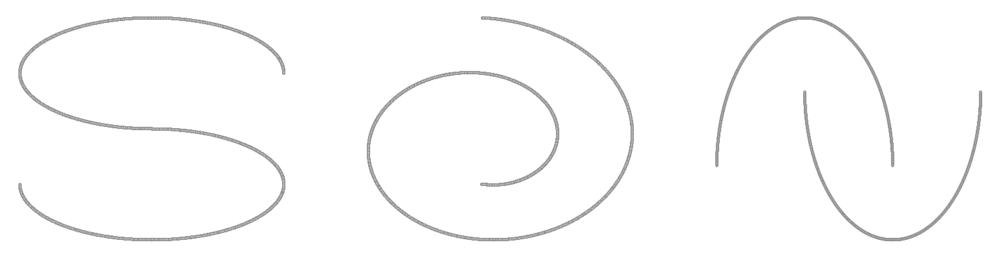

In [ ]:
swiss_roll, swiss_color = make_swiss_roll(10**4,noise=0)
swiss_roll = swiss_roll[:, [0, 2]]/10.0

s_curve, s_color= make_s_curve(10**4, noise=0)
s_curve = s_curve[:, [0, 2]]/10.0

moons, moons_color = make_moons(10**4, noise=0)

data = s_curve.T
#dataset = torch.Tensor(data.T).float()
#dataset_color = s_color

fig,axes = plt.subplots(1,3,figsize=(20,5))

axes[0].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=5)
axes[0].axis('off')

data = swiss_roll.T
axes[1].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=5)
axes[1].axis('off')
dataset = torch.Tensor(data.T).float()
dataset_color = swiss_color


data = moons.T
axes[2].scatter(*data, alpha=0.5, color='white', edgecolor='gray', s=3)
axes[2].axis('off')
#dataset = torch.Tensor(data.T).float()
#dataset_color = moons_color



# Definition of the diffusion schedule

In [ ]:
def make_beta_schedule(schedule='linear', n_timesteps=1000, start=1e-5, end=1e-2):
    """
    Computation of the beta_t (variance schedule)
    """
    if schedule == 'linear':
        betas = torch.linspace(start, end, n_timesteps)
    elif schedule == "quad":
        betas = torch.linspace(start ** 0.5, end ** 0.5, n_timesteps) ** 2
    elif schedule == "sigmoid":
        betas = torch.linspace(-6, 6, n_timesteps)
        betas = torch.sigmoid(betas) * (end - start) + start
    return betas

In [ ]:
num_steps = 100
#betas = torch.tensor([1.7e-5] * num_steps)
betas = make_beta_schedule(schedule='linear', n_timesteps=num_steps, start=1e-5, end=0.5e-2)

alphas = 1 - betas
alphas_prod = torch.cumprod(alphas, 0)
alphas_prod_p = torch.cat([torch.tensor([1]).float(), alphas_prod[:-1]], 0)
alphas_bar_sqrt = torch.sqrt(alphas_prod)
one_minus_alphas_bar_log = torch.log(1 - alphas_prod)
one_minus_alphas_bar_sqrt = torch.sqrt(1 - alphas_prod)

In [ ]:
def extract(input, t, x):
    shape = x.shape
    out = torch.gather(input, 0, t.to(input.device))
    reshape = [t.shape[0]] + [1] * (len(shape) - 1)
    return out.reshape(*reshape)

# Forward diffusion process

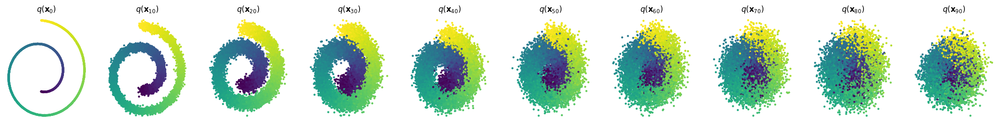

In [ ]:
def q_x(x_0, t, noise=None):
    """
    Sampling of the noisy image x_t using only x_0 and one gaussian random variable
    using the reparameterization trick
    """
    if noise is None:
        noise = torch.randn_like(x_0)
    alphas_t = extract(alphas_bar_sqrt, t, x_0)
    alphas_1_m_t = extract(one_minus_alphas_bar_sqrt, t, x_0)
    return (alphas_t * x_0 + alphas_1_m_t * noise)


fig, axs = plt.subplots(1, 10, figsize=(28, 3))
for i in range(10):
    q_i = q_x(dataset, torch.tensor([i * 10]))
    axs[i].scatter(q_i[:, 0], q_i[:, 1],c=dataset_color, s=5)
    axs[i].set_axis_off(); axs[i].set_title('$q(\mathbf{x}_{'+str(i*10)+'})$')



In [ ]:
posterior_mean_coef_1 = (betas * torch.sqrt(alphas_prod_p) / (1 - alphas_prod))
posterior_mean_coef_2 = ((1 - alphas_prod_p) * torch.sqrt(alphas) / (1 - alphas_prod))
posterior_variance = betas * (1 - alphas_prod_p) / (1 - alphas_prod)
posterior_log_variance_clipped = torch.log(torch.cat((posterior_variance[1].view(1, 1), posterior_variance[1:].view(-1, 1)), 0)).view(-1)

def q_posterior_mean_variance(x_0, x_t, t):
    coef_1 = extract(posterior_mean_coef_1, t, x_0)
    coef_2 = extract(posterior_mean_coef_2, t, x_0)
    mean = coef_1 * x_0 + coef_2 * x_t
    var = extract(posterior_log_variance_clipped, t, x_0)
    return mean, var



# Reverse diffusion process

In [ ]:
def p_sample(model, x, t,alphas,betas,one_minus_alphas_bar_sqrt):
    t = torch.tensor([t])
    # Factor to the model output
    eps_factor = ((1 - extract(alphas, t, x)) / extract(one_minus_alphas_bar_sqrt, t, x))
    # Model output
    eps_theta = model(x,t)
    # Final values
    mean = (1 / extract(alphas, t, x).sqrt()) * (x - (eps_factor * eps_theta))
    # Generate z
    z = torch.randn_like(x)
    # Fixed sigma
    sigma_t = extract(betas, t, x).sqrt()
    sample = mean + sigma_t * z
    return (sample)

def p_sample_loop(model, shape,n_steps,alphas,betas,one_minus_alphas_bar_sqrt, noise = None):
    if noise == None :
        cur_x = torch.randn(shape)
    else:
        cur_x = noise
    x_seq = [cur_x]
    for i in reversed(range(n_steps)):
        cur_x = p_sample(model, cur_x, i,alphas,betas,one_minus_alphas_bar_sqrt)
        x_seq.append(cur_x)
    return x_seq

# Model


In [ ]:

import torch.nn as nn
import torch.nn.functional as F

class ConditionalLinear(nn.Module):
    def __init__(self, num_in, num_out, n_steps):
        super(ConditionalLinear, self).__init__()
        self.num_out = num_out
        self.lin = nn.Linear(num_in, num_out)
        self.embed = nn.Embedding(n_steps, num_out)
        self.embed.weight.data.uniform_()

    def forward(self, x, y):
        out = self.lin(x)
        gamma = self.embed(y)
        out = gamma.view(-1, self.num_out) * out
        return out
        
class ConditionalModel(nn.Module):
    def __init__(self, n_steps):
        super(ConditionalModel, self).__init__()
        self.lin1 = ConditionalLinear(2, 16, n_steps)
        self.lin2 = ConditionalLinear(16, 16, n_steps)
        self.lin3 = ConditionalLinear(16, 16, n_steps)
        self.lin4 = nn.Linear(16, 2)
    
    def forward(self, x, y):
        x = F.softplus(self.lin1(x, y))
        x = F.softplus(self.lin2(x, y))
        x = F.softplus(self.lin3(x, y))
        return self.lin4(x)

# Loss

In [ ]:
def noise_estimation_loss(model, x_0,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,n_steps):
    batch_size = x_0.shape[0]
    # Select a random step for each example
    t = torch.randint(0, n_steps, size=(batch_size // 2 + 1,))
    t = torch.cat([t, n_steps - t - 1], dim=0)[:batch_size].long()
    # x0 multiplier
    a = extract(alphas_bar_sqrt, t, x_0)
    # eps multiplier
    am1 = extract(one_minus_alphas_bar_sqrt, t, x_0)
    e = torch.randn_like(x_0)
    # model input
    x = x_0 * a + e * am1
    output = model(x,t)
    return (e - output).square().mean()

# Training

tensor(0.9801, grad_fn=<MeanBackward0>)
tensor(0.5562, grad_fn=<MeanBackward0>)
tensor(0.6907, grad_fn=<MeanBackward0>)
tensor(0.6692, grad_fn=<MeanBackward0>)
tensor(0.4005, grad_fn=<MeanBackward0>)
tensor(0.6834, grad_fn=<MeanBackward0>)
tensor(1.1142, grad_fn=<MeanBackward0>)
tensor(0.8285, grad_fn=<MeanBackward0>)
tensor(1.3063, grad_fn=<MeanBackward0>)
tensor(0.6716, grad_fn=<MeanBackward0>)
tensor(0.4563, grad_fn=<MeanBackward0>)
tensor(0.8278, grad_fn=<MeanBackward0>)
tensor(0.5112, grad_fn=<MeanBackward0>)
tensor(0.7523, grad_fn=<MeanBackward0>)
tensor(0.4755, grad_fn=<MeanBackward0>)
tensor(0.6671, grad_fn=<MeanBackward0>)
tensor(0.3174, grad_fn=<MeanBackward0>)
tensor(0.8487, grad_fn=<MeanBackward0>)
tensor(0.6911, grad_fn=<MeanBackward0>)
tensor(0.7535, grad_fn=<MeanBackward0>)
tensor(0.8030, grad_fn=<MeanBackward0>)


C:\Users\jmppi\AppData\Local\Temp\ipykernel_21408\2320372302.py:29: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig, axs = plt.subplots(1, 10, figsize=(28, 3))


tensor(0.4602, grad_fn=<MeanBackward0>)
tensor(0.5542, grad_fn=<MeanBackward0>)
tensor(0.7236, grad_fn=<MeanBackward0>)
tensor(0.4821, grad_fn=<MeanBackward0>)
tensor(0.6784, grad_fn=<MeanBackward0>)
tensor(0.3908, grad_fn=<MeanBackward0>)
tensor(0.7367, grad_fn=<MeanBackward0>)
tensor(0.8177, grad_fn=<MeanBackward0>)
tensor(0.8471, grad_fn=<MeanBackward0>)
tensor(0.4118, grad_fn=<MeanBackward0>)
tensor(0.5043, grad_fn=<MeanBackward0>)
tensor(0.6384, grad_fn=<MeanBackward0>)
tensor(0.6362, grad_fn=<MeanBackward0>)
tensor(0.6037, grad_fn=<MeanBackward0>)
tensor(0.3709, grad_fn=<MeanBackward0>)
tensor(0.6086, grad_fn=<MeanBackward0>)
tensor(0.2929, grad_fn=<MeanBackward0>)
tensor(0.5574, grad_fn=<MeanBackward0>)
tensor(0.6573, grad_fn=<MeanBackward0>)
tensor(0.5527, grad_fn=<MeanBackward0>)
tensor(0.6575, grad_fn=<MeanBackward0>)
tensor(0.4182, grad_fn=<MeanBackward0>)
tensor(0.5863, grad_fn=<MeanBackward0>)
tensor(0.7138, grad_fn=<MeanBackward0>)
tensor(0.6030, grad_fn=<MeanBackward0>)


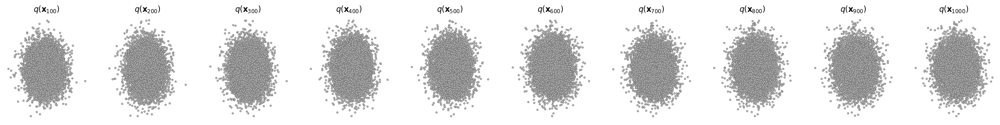

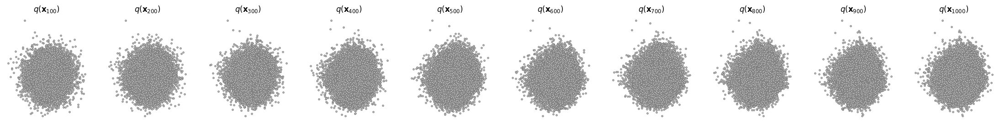

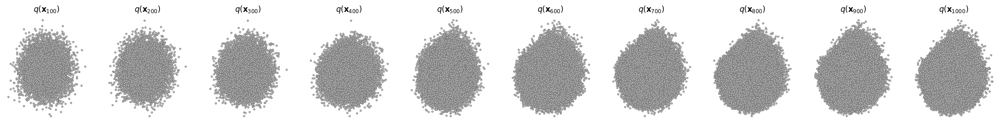

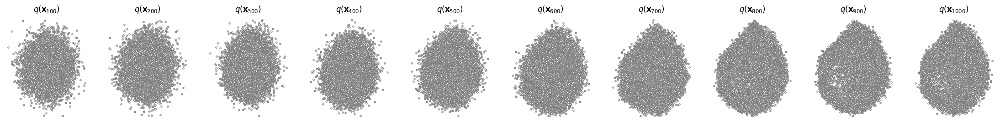

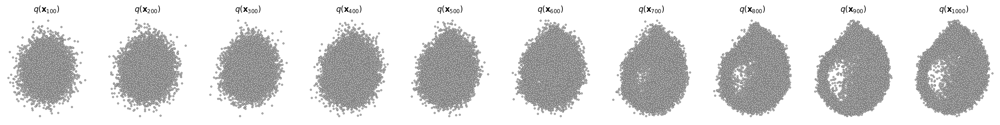

...

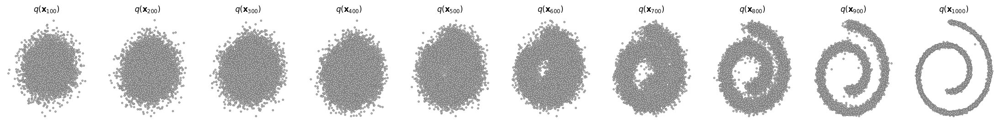

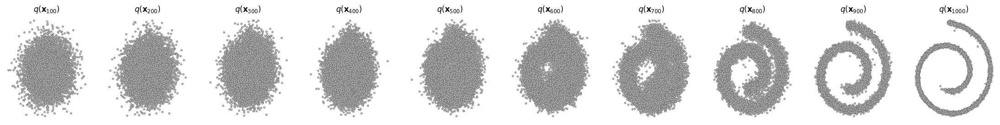

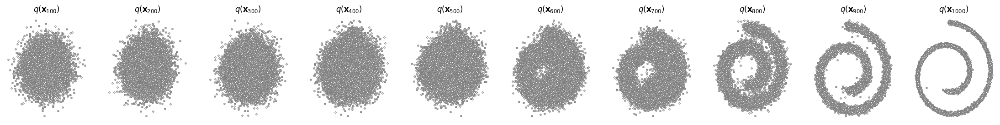

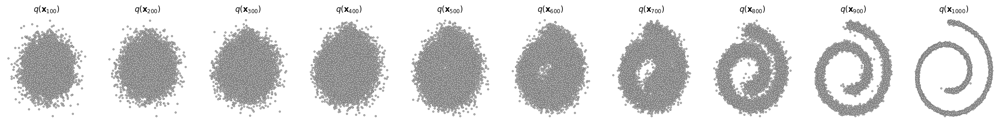

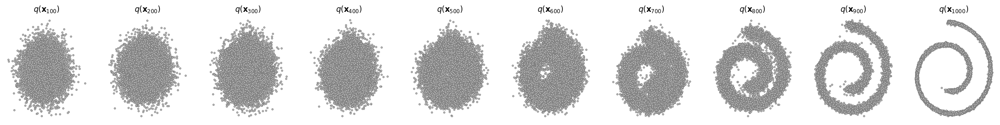

In [ ]:
import torch.optim as optim

model = ConditionalModel(num_steps)
optimizer = optim.Adam(model.parameters(), lr=1e-3)
# Batch size
batch_size = 128
for t in range(5000):
    # X is a torch Variable
    permutation = torch.randperm(dataset.size()[0])
    for i in range(0, dataset.size()[0], batch_size):
        # Retrieve current batch
        indices = permutation[i:i+batch_size]
        batch_x = dataset[indices]
        # Compute the loss.
        loss = noise_estimation_loss(model, batch_x,alphas_bar_sqrt,one_minus_alphas_bar_sqrt,num_steps)
        # Before the backward pass, zero all of the network gradients
        optimizer.zero_grad()
        # Backward pass: compute gradient of the loss with respect to parameters
        loss.backward()
        # Perform gradient clipping
        torch.nn.utils.clip_grad_norm_(model.parameters(), 1.)
        # Calling the step function to update the parameters
        optimizer.step()
        # Update the exponential moving average
    # Print loss
    if (t % 100 == 0):
        print(loss)
        x_seq = p_sample_loop(model, dataset.shape,num_steps,alphas,betas,one_minus_alphas_bar_sqrt)
        fig, axs = plt.subplots(1, 10, figsize=(28, 3))
        for i in range(1, 11):
            cur_x = x_seq[i * 10].detach()
            axs[i-1].scatter(cur_x[:, 0], cur_x[:, 1],color='white',edgecolor='gray', s=5)
            axs[i-1].set_axis_off(); 
            axs[i-1].set_title('$q(\mathbf{x}_{'+str(i*100)+'})$')



# Forward image sequence generation 

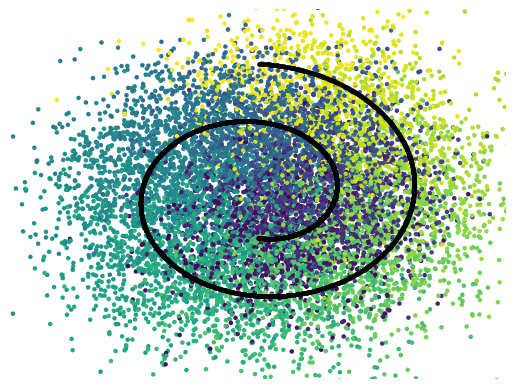

In [ ]:
import io
from PIL import Image

data = swiss_roll.T
color_swiss = swiss_color.T

forward = []
#fig, axs = plt.subplots(1, 10, figsize=(28, 3))
for i in range(num_steps):
    plt.clf()
    q_i = q_x(dataset, torch.tensor([i]))
    plt.scatter(q_i[:, 0], q_i[:, 1],c = color_swiss, s=5)
    plt.scatter(*data, alpha=0.2, color = "black", s=5)
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    plt.axis('off'); 
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    forward.append(img)
    



In [ ]:
imgs_diff_forward = forward
imgs_diff_forward[0].save("diffusion_forward.gif", format='GIF', append_images=forward,save_all=True, duration=100, loop=0)

# Reverse image sequence generation 

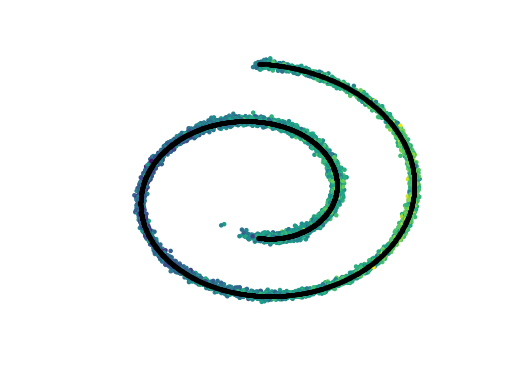

In [ ]:
reverse = []
#indices = np.random.randint(0,dataset.size()[0],10)
data = swiss_roll.T
color_swiss = swiss_color.T
 

trajectoire = []
x_seq = p_sample_loop(model, dataset.shape,num_steps,alphas,betas,one_minus_alphas_bar_sqrt, noise = q_i)

for i in range(num_steps):  

    plt.clf()
    #plt.scatter(cur_x[indices[0], 0], cur_x[indices[0], 1],color='blue',edgecolor='gray', s=20,vmin = 2, vmax = 2)
    plt.scatter(*data, alpha=0.5, c=color_swiss, edgecolor='gray', s=5)
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    plt.axis('off')
    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    trajectoire.append(img)


    plt.clf()
    cur_x = x_seq[i].detach()
    plt.scatter(cur_x[:, 0], cur_x[:, 1],c= x_seq[0].detach()[:,0], s=5)
    plt.scatter(*data, alpha=0.2, color = "black", s=5)
    plt.xlim(-2,2)
    plt.ylim(-2,2)
    #plt.scatter(cur_x[indices, 0], cur_x[indices, 1],color='blue',edgecolor='gray', s=20)
    plt.axis('off')
    
    img_buf = io.BytesIO()
    plt.savefig(img_buf, format='png')
    img = Image.open(img_buf)
    reverse.append(img)





In [ ]:
imgs_diff = forward + reverse
imgs_diff[0].save("diffusion.gif", format='GIF', append_images=forward + reverse,save_all=True, duration=num_steps, loop=0)


In [ ]:
imgs_traj = trajectoire
imgs_traj[0].save("trajectoire.gif", format='GIF', append_images=trajectoire,save_all=True, duration=num_steps, loop=0)


In [ ]:
imgs_reverse = reverse
imgs_reverse[0].save("diffusion_reverse.gif", format='GIF', append_images=reverse,save_all=True, duration=num_steps, loop=0)
